In [2]:
import numpy as np
import scipy
from scipy.stats import zscore, binned_statistic, binned_statistic_2d
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('image', cmap='viridis')
import glob
from func import *

ModuleNotFoundError: No module named 'tdt'

## Load data:

In [18]:
# folder = '/jukebox/falkner/Dakota/PMV_AM/datM745_pairwise_BalbC/*'
folder = '/Users/yuhanche/Documents/Data/PMV_AM/745_social/'
fps = 40 # camera frame per second
crop_length = 120
xlim = [400, 1050]
ylim = [0, 1000]

# position data in csv
files = sorted(glob.glob((folder +'*_b-*.csv')))
print('DeepLabCut spreadsheets:' )
for f in files:
    print(f)
pos = [calculate_animal_centroids(f) for f in files] 

# GCaMP data in cage folders
fp_dat = sorted(glob.glob((folder + '*cage*/')))
print('\nRecording data:')
for f in fp_dat:
    print(f) 
fp = [load_fp(f) for f in fp_dat]

# extract position data and downsample GCaMP data
Cx = []
Cy = []
Ix = []
Iy = []
GCAMP = []
fram = []
fs = []
sig=[]
time=[]
offset=1
for i in range(len(fp_dat)):
    Cx.append(pos[i][0])
    Cy.append(pos[i][1])
    Ix.append(pos[i][2])
    Iy.append(pos[i][3])
    GCAMP.append(fp[i][0])
    fram.append(fp[i][2])
    fs.append(fp[i][3])
    ds = downsample_FP(GCAMP[i], fram[i], fs[i], Cx[i], offset=offset, cam_fr=fps)
    sig.append(ds[0])
    time.append(ds[1])

sigfilt = [updated_filter(s) for s in sig]

DeepLabCut spreadsheets:
/Users/yuhanche/Documents/Data/PMV_AM/745_social/200212_datM745_pairwise_BalbC_bccage1_b-02122020133750-0000DeepCut_resnet50_200115_pairwiseHCJan15shuffle1_400000.csv
/Users/yuhanche/Documents/Data/PMV_AM/745_social/200212_datM745_pairwise_BalbC_bccage2_b-02122020140312-0000DeepCut_resnet50_200115_pairwiseHCJan15shuffle1_400000.csv
/Users/yuhanche/Documents/Data/PMV_AM/745_social/200212_datM745_pairwise_BalbC_homecage1_b-02122020132857-0000DeepCut_resnet50_200115_pairwiseHCJan15shuffle1_400000.csv
/Users/yuhanche/Documents/Data/PMV_AM/745_social/200212_datM745_pairwise_BalbC_homecage2_b-02122020134945-0000DeepCut_resnet50_200115_pairwiseHCJan15shuffle1_400000.csv

Recording data:
/Users/yuhanche/Documents/Data/PMV_AM/745_social/pairwise_BalbC_bccage1/
/Users/yuhanche/Documents/Data/PMV_AM/745_social/pairwise_BalbC_bccage2/
/Users/yuhanche/Documents/Data/PMV_AM/745_social/pairwise_BalbC_homecage1/
/Users/yuhanche/Documents/Data/PMV_AM/745_social/pairwise_BalbC_h

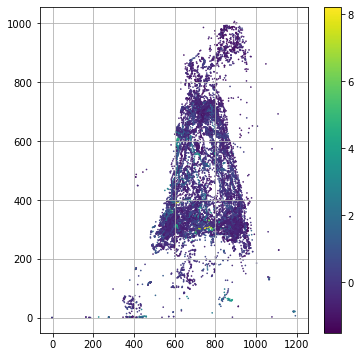

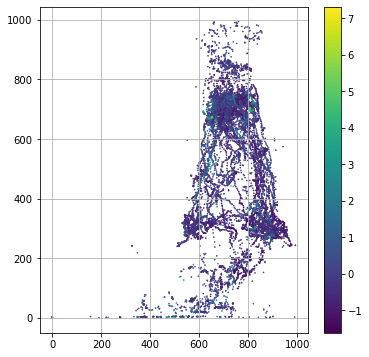

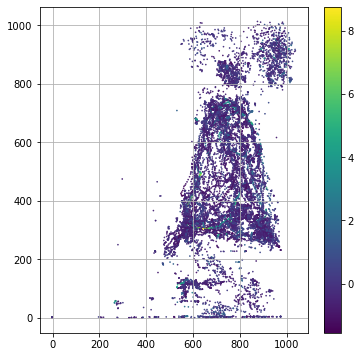

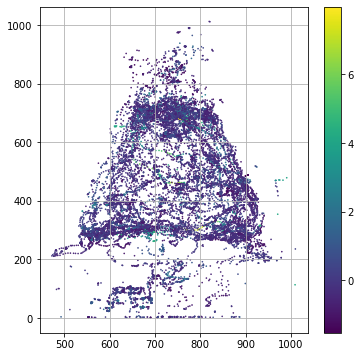

In [3]:
for i in range(len(Cx)):
    plt.figure(figsize=(6,6))
    plt.scatter(Cx[i], Cy[i], s=0.4, c=sigfilt[i])
    plt.grid()
    plt.colorbar()
    plt.show()

## Crop 150s of recording

In [52]:
def int_2_one_hot(a, dim=None):
    """Convert integer encodings (start from zero) on a vector to a matrix of one-hot-encoding
    """
    if dim is None:
        dim = a.max() + 1
    n = len(a)
    b = np.zeros((n, dim))
    b[np.arange(n), a] = 1
    return b

def filter_xy(x, y, percentile=98):
    """filter out XY coordinates outliers based on Euclidean distance difference percentile and linearly interpolate values"""
    dis_diff = (np.diff(x))**2 + (np.diff(y))**2
    bad_inx = np.where(dis_diff > np.percentile(dis_diff, percentile))[0] + 1
    good_inx = np.where(dis_diff <= np.percentile(dis_diff, percentile))[0] + 1
    good_inx = np.concatenate([[0], good_inx])
    x_interped = np.interp(bad_inx, good_inx, x[good_inx])
    x[bad_inx] = x_interped
    y_interped = np.interp(bad_inx, good_inx, y[good_inx])
    y[bad_inx] = y_interped
    return x, y

def load_data(i, Cx, Cy, sig, time, start, end, plot=False):
    x = Cx[i][start[i]:end[i]]
    y = Cy[i][start[i]:end[i]]
    z = sig[i][start[i]:end[i]]
    x, y = filter_xy(x, y)
    if plot:
        plt.figure(figsize=(6,6))
        plt.scatter(x, y, c=z, s=0.6)
        plt.grid()
        plt.title('GCAMP signal trace')
        plt.colorbar()
        plt.show()

        fig, ax = plt.subplots(figsize=(14,3))
        plt.plot(time[i], sig[i])
        plt.margins(x=0)
        ax.axvline(time[i][start[i]], c='k', linestyle='-',alpha=0.3)
        ax.axvline(time[i][end[i]], c='k', linestyle='-',alpha=0.3)
        plt.ylabel('GCaMP signal')
        plt.xlabel('time(s)')
        plt.show()
    return x, y, z

def load_data_social(i, Cx, Cy, Ix, Iy, sig, time, exp_start, exp_end, soc_start, soc_end, plot=False):
    # exploration condition
    x = Cx[i][exp_start[i]:exp_end[i]]
    y = Cy[i][exp_start[i]:exp_end[i]]
    z = sig[i][exp_start[i]:exp_end[i]]
    x, y = filter_xy(x, y)
    
    # social condition
    x_soc = Cx[i][soc_start[i]:soc_end[i]]
    y_soc = Cy[i][soc_start[i]:soc_end[i]]
    ix_soc = Ix[i][soc_start[i]:soc_end[i]]
    iy_soc = Iy[i][soc_start[i]:soc_end[i]]
    z_soc = sig[i][soc_start[i]:soc_end[i]]
    x_soc, y_soc = filter_xy(x_soc, y_soc)
    ix_soc, iy_soc = filter_xy(ix_soc, iy_soc)

    if plot:
        plt.figure(figsize=(6,6))
        plt.scatter(x, y, c=z, s=0.6)
        plt.grid()
        plt.title('GCAMP signal trace solo')
        plt.colorbar()
        plt.show()

        plt.figure(figsize=(6,6))
        plt.scatter(x_soc, y_soc, c=z_soc, s=0.6)
        plt.grid()
        plt.title('GCAMP signal trace social')
        plt.colorbar()
        plt.show()

        fig, ax = plt.subplots(figsize=(14,3))
        plt.plot(time[i], sig[i])
        plt.margins(x=0)
        ax.axvline(time[i][exp_start[i]], c='k', linestyle='-',alpha=0.3)
        ax.axvline(time[i][exp_end[i]], c='k', linestyle='-',alpha=0.3)
        ax.axvline(time[i][soc_start[i]], c='b', linestyle='-',alpha=0.3)
        ax.axvline(time[i][soc_end[i]], c='b', linestyle='-',alpha=0.3)
        plt.ylabel('GCaMP signal')
        plt.xlabel('time(s)')
        plt.show()
    return x, y, z, x_soc, y_soc, z_soc, ix_soc, iy_soc

In [19]:
############ updated bc1,bc2,hc1,hc2
times_in_exp = np.array([10,9,1,1])
times_out_exp = times_in_exp + crop_length
times_in_soc= np.array([167,145,122,141]) 
times_out_soc = times_in_soc + crop_length 
exp_start = []
exp_end = []
soc_start = []
soc_end = []
for i in range(len(times_in_exp)):
    exp_start.append(np.argmin(abs(times_in_exp[i] - time[i])))
    exp_end.append(np.argmin(abs(times_out_exp[i] - time[i])))
    
    soc_start.append(np.argmin(abs(times_in_soc[i] - time[i])))
    soc_end.append(np.argmin(abs(times_out_soc[i] - time[i])))

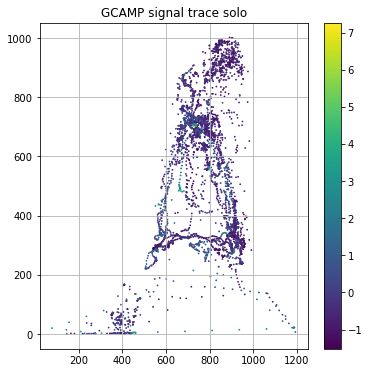

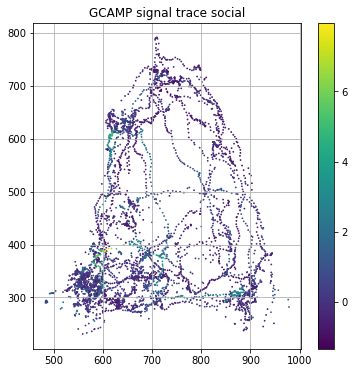

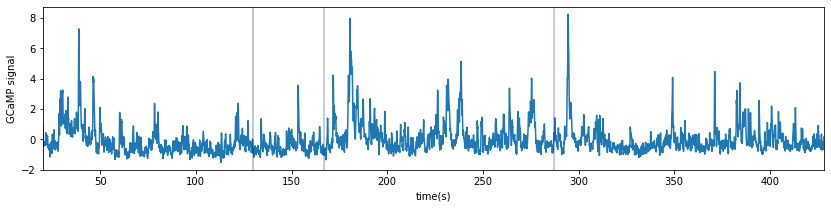

In [157]:
file_inx = 0
x, y, gcamp, x_soc, y_soc, gcamp_soc, ix_soc, iy_soc = load_data_social(file_inx, Cx, Cy, Ix, Iy, sigfilt, time, exp_start, exp_end, soc_start, soc_end, plot=True)
dist = np.array([calculate_intruder_distance(x_soc, y_soc, 
                                            ix_soc, iy_soc)])[0]
time_soc = time[file_inx][soc_start[file_inx]:soc_end[file_inx]]
time_exp =  time[file_inx][exp_start[file_inx]:exp_end[file_inx]]

### occupancy plot

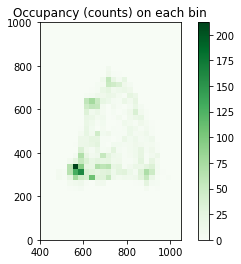

Number of bins explored:  259 / 1040


In [174]:
# note the X outside xlim is still counted into one binnumber, but not into statistics
# the number of values of binnumber is len(x_edges) + 1
# the shape of r.statistic is (len(x_edges)-1, len(y_edges)-1)
binwidth = 25
x_edges = np.arange(xlim[0], xlim[-1] + binwidth, binwidth) 
y_edges = np.arange(ylim[0], ylim[-1] + binwidth, binwidth) 
n_bins = (len(x_edges) + 1) * (len(y_edges) + 1) # total number of bins
n_bins_test = (len(x_edges) - 1) * (len(y_edges) - 1) # the number of bins inside the XY edges

r_count = binned_statistic_2d(x_soc, y_soc, None, 'count', bins=[x_edges, y_edges])
plt.imshow(r_count.statistic.T, origin='lower', extent=(*xlim, *ylim))
plt.colorbar()
plt.title('Occupancy (counts) on each bin')
plt.set_cmap('Greens')
plt.show()

print('Number of bins explored: ', np.sum(r_count.statistic > 0), '/', n_bins_test)

## Model: Average signal in each bin

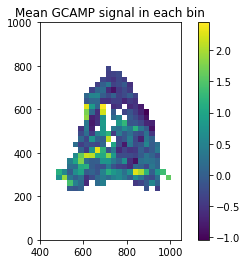

R^2 score: -0.4608892410536125


In [139]:
r_mean = binned_statistic_2d(x_soc, y_soc, gcamp_soc, 'mean', bins=[x_edges, y_edges], expand_binnumbers=True)
plt.imshow(r_mean.statistic.T, origin='lower', extent=(*xlim, *ylim))
plt.colorbar()
plt.title('Mean GCAMP signal in each bin')
plt.show()
# there are nans in the statistic

y_mean_pred = np.ones_like(gcamp) * gcamp.mean() # outside just use global mean
for i in range(len(gcamp)):
    x_inx = r_mean.binnumber[0][i] - 1
    y_inx = r_mean.binnumber[1][i] - 1
    if (x_inx >= 0) & (x_inx < r_mean.statistic.shape[0]) & (y_inx >=0) & (y_inx < r_mean.statistic.shape[1]):
        # exclude the ones outside our bin range
        y_mean_pred[i] = r_mean.statistic[x_inx, y_inx]

print('R^2 score:', r2_score(gcamp, y_mean_pred))

### Train test split and ignore columns with all zeros

In [156]:
def insert_constant_column(x):
    return np.hstack([np.ones(x.shape[0]).reshape(-1, 1), x]) # add a column of ones

def crop_test(X, y, crop_start=0.5, test_ratio=0.2):
    """crop a continuous part of the data as test set. Returns (X_train, X_test, y_train, y_test)"""
    n = X.shape[0]
    inx_array = np.arange(n)
    start_inx = round(n * crop_start)
    end_inx = round(n * (crop_start + test_ratio))
    test_inx = inx_array[start_inx:end_inx]
    train_inx = np.concatenate([inx_array[:start_inx], inx_array[end_inx:]])
    return X[train_inx, :], X[test_inx, :], y[train_inx], y[test_inx], train_inx, test_inx

def least_sq_fit(X, z):
    # model y = X @ w, where X contains constant column
    col_inx = np.where(X.sum(axis=0) > 0)[0]
    w_full = np.zeros(X.shape[1])
    x = X[:, col_inx]
    w, res, rank, s = np.linalg.lstsq(x.T @ x, x.T @ z)
    w_full[col_inx] = w
    return w_full

def visualize_w(w, x_edges, y_edges, title):
    nx = len(x_edges) + 1
    ny = len(y_edges) + 1
    w_sp = w[:(nx * ny + 1)] # take the spatial part
    ls_w = w_sp[1:] + w_sp[0] # remove and add the first constant term
    w_grid_full = ls_w.reshape(nx, ny)
    w_grid = np.delete(w_grid_full, (0, -1), axis=0) # the first and last column are outside of range
    w_grid = np.delete(w_grid, (0, -1), axis=1) # the first and last row are outside of range

    plt.imshow(w_grid.T, origin='lower' , extent=(x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]))
    plt.title(title)
    plt.colorbar()
    plt.show()

def plot_fit(y, y_fit, t):
    plt.figure(figsize=(8,3))
    plt.plot(t, y)
    plt.plot(t, y_fit, alpha=0.7)
    plt.margins(x=0)
    plt.legend(['data', 'fitted'])
    plt.xlabel('time(s)')
    plt.ylabel('GCaMP signal')
    plt.show()

In [1]:
r_count = binned_statistic_2d(x_soc, y_soc, None, 'count', bins=[x_edges, y_edges])
X_sp = int_2_one_hot(r_count.binnumber, dim=n_bins) # spatial part
dist_bins = np.array([20.0, 80.0, 200.0]) # bin distances b/t mice
X_soc = int_2_one_hot(np.digitize(dist, dist_bins))
X_full = np.hstack((X_sp, X_soc) )
# X_train, X_test, z_train, z_test = crop_test(dist.reshape(-1, 1), gcamp_soc, 0.3, 0.1) 
X_train, X_test, z_train, z_test, train_inx, test_inx = crop_test(X_sp, gcamp_soc, 0.9, 0.1) 


scaler = StandardScaler().fit(X_train) # standardizer
X_train2 = scaler.transform(X_train)
X_test2 = scaler.transform(X_test)

X_train = insert_constant_column(X_train)
X_test = insert_constant_column(X_test)
X = insert_constant_column(X_full)
print(X_train.shape)

# standardized version
X_train2 = insert_constant_column(X_train2)
X_test2 = insert_constant_column(X_test2)

NameError: name 'binned_statistic_2d' is not defined

## Model: Least square fit (linear regression)

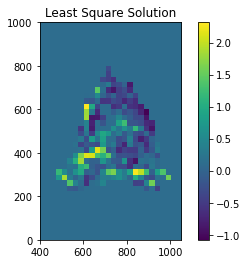

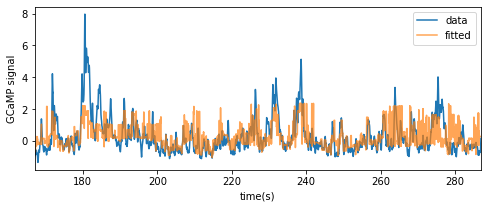

Train r^2:  0.3675893209922312
Test r^2:  -0.2828538506539948


In [160]:
w_lsq = least_sq_fit(X_train, z_train)

visualize_w(w_lsq, x_edges, y_edges, title='Least Square Solution')
plot_fit(gcamp_soc, X @ w_lsq, time_soc)

print('Train r^2: ', r2_score(z_train, X_train @ w_lsq))
print('Test r^2: ', r2_score(z_test, X_test @ w_lsq))


## Model: Least square + l-2 penalty (Ridge Regression)

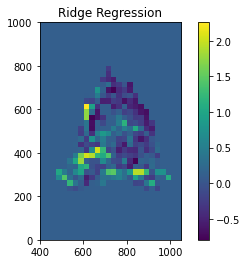

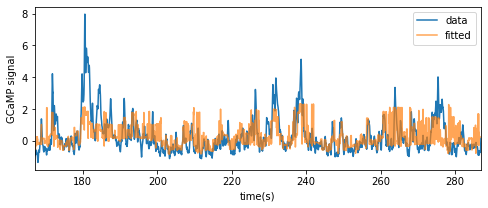

Train r^2:  0.36545194239467027
Test r^2:  -0.20979779665298381


In [161]:
from sklearn.linear_model import RidgeCV
l2_model = RidgeCV(alphas=np.arange(0.1, 5, 0.1), fit_intercept=False)
l2_model.fit(X_train, z_train)
w_l2 = l2_model.coef_

visualize_w(w_l2, x_edges, y_edges, title='Ridge Regression')
plot_fit(gcamp_soc, X @ w_l2, time_soc)

print('Train r^2: ', r2_score(z_train, X_train @ w_l2))
print('Test r^2: ', r2_score(z_test, X_test @ w_l2))

## Add smooth prior (graph Laplacian)

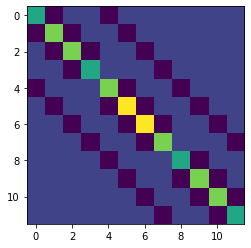

In [38]:
def graph_laplacian(n):
  m = np.eye(n) * 2 + np.diag(- np.ones(n-1), -1) + np.diag(- np.ones(n-1), 1)
  m[0,0] = 1
  m[-1,-1] = 1 
  return m
# for adding the social part to the design matrix, 
def graph_l_2d(nx, ny):
    return np.kron(graph_laplacian(nx), np.eye(ny)) + np.kron(np.eye(nx), graph_laplacian(ny),)

def customize_lsq_fit(X, z, prior_matrix, lam):
    x = X
    w, res, rank, s = np.linalg.lstsq(x.T @ x + lam * prior_matrix, x.T @ z)
    return w

plt.imshow(graph_l_2d(3,4))
plt.show()

In [110]:
X_soc.shape

(4883, 4)

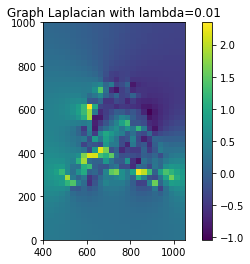

Train r^2:  0.3675866451818588
Test r^2:  -0.33376362047363406


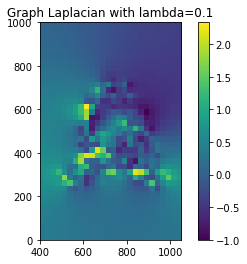

Train r^2:  0.3673844998572928
Test r^2:  -0.31240645505300124


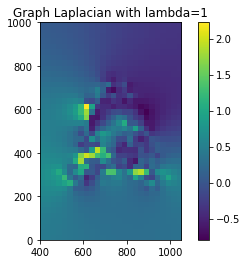

Train r^2:  0.3609717874660108
Test r^2:  -0.23361503570971065


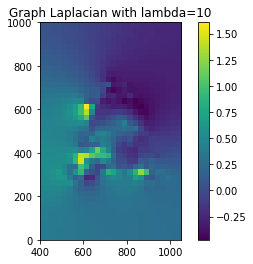

Train r^2:  0.29772320488069914
Test r^2:  -0.0966046798515019


In [164]:
nx = len(x_edges) + 1
ny = len(y_edges) + 1 
graphL = graph_l_2d(nx,ny)
n_gl = graphL.shape[0]
prior_gl = np.eye(nx * ny + 1 + X_soc.shape[1]) # add a 1 on the first diagonal to account for the constant term
prior_gl[1:(1 + n_gl), 1:(1 + n_gl)] = graphL
for lam in [0.01, 0.1, 1, 10]:
    w_gl = customize_lsq_fit(X_train, z_train, prior_gl, lam)
    visualize_w(w_gl, x_edges, y_edges, 'Graph Laplacian with lambda=' + str(lam))
    print('Train r^2: ', r2_score(z_train, X_train @ w_gl))
    print('Test r^2: ', r2_score(z_test, X_test @ w_gl))

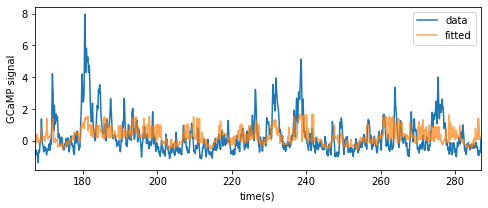

In [165]:
plot_fit(gcamp_soc, X @ w_gl, time_soc)

## Model: Gaussian Process Regression

In [167]:
X_train.shape

(4395, 1181)

In [170]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
gpr = GaussianProcessRegressor(n_restarts_optimizer=9, normalize_y=False)
gpr.fit(X_train, z_train)

x_plot = np.hstack([np.ones(X_train.shape[1] - 1).reshape(-1, 1), np.eye(X_train.shape[1] - 1)])
y_pred, std_pred = gpr.predict(x_plot, return_std=True)
# gp_grid_full = y_pred.reshape(len(x_edges) + 1 , len(y_edges) + 1)
# gp_grid = np.delete(gp_grid_full, (0, -1), axis=0) # the first and last column are outside of range
# gp_grid = np.delete(gp_grid, (0, -1), axis=1) # the first and last row are outside of range

# plt.imshow(gp_grid.T, origin='lower', extent=(*xlim, *ylim))
# plt.colorbar()
# plt.title('GP Regression')
# # plt.savefig('GPR_fit.png')
# plt.show()

TypeError: visualize_w() missing 2 required positional arguments: 'y_edges' and 'title'

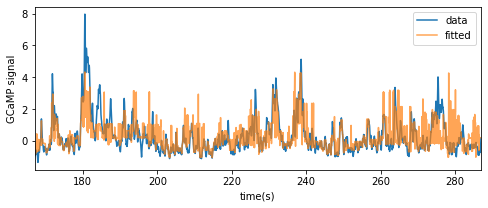

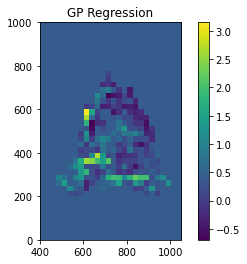

Train r^2:  0.4977458540832158
Test r^2:  -0.2354093375928359


In [171]:
plot_fit(gcamp_soc, gpr.predict(X), time_soc)
visualize_w(y_pred, x_edges, y_edges, 'GP Regression')

print('Train r^2: ', r2_score(z_train, gpr.predict(X_train)))
print('Test r^2: ', r2_score(z_test, gpr.predict(X_test)))

In [56]:
dir(gpr)

['L_',
 'X_train_',
 '_K_inv',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_check_n_features',
 '_constrained_optimization',
 '_estimator_type',
 '_get_param_names',
 '_get_tags',
 '_more_tags',
 '_repr_html_',
 '_repr_html_inner',
 '_repr_mimebundle_',
 '_rng',
 '_validate_data',
 '_y_train_mean',
 '_y_train_std',
 'alpha',
 'alpha_',
 'copy_X_train',
 'fit',
 'get_params',
 'kernel',
 'kernel_',
 'log_marginal_likelihood',
 'log_marginal_likelihood_value_',
 'n_features_in_',
 'n_restarts_optimizer',
 'normalize_y',
 'optimizer',
 'predict',
 'random_state',
 'sample_y',
 'score',
 'set_params',
 'y_train_']

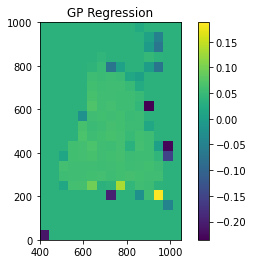

In [75]:
plt.imshow((gp_grid_full - w_l2_grid_full).T, origin='lower', extent=(*xlim, *ylim))
plt.colorbar()
plt.title('GP Regression')
plt.show()

In [18]:
# export to .mat file
import scipy.io
for i in range(len(fp)):
    matname=fp_dat[i][(fp_dat[i].rfind('_')+1):(len(fp_dat[i])-1)]+'.mat'
    scipy.io.savemat(folder+matname, mdict={'time':time[i][start[i]:end[i]],'z_sig':z_sig[i][start[i]:end[i]],'ds_sig': sig[i][start[i]:end[i]]
                                     ,'Cx':Cx[i][start[i]:end[i]],'Cy':Cy[i][start[i]:end[i]]})

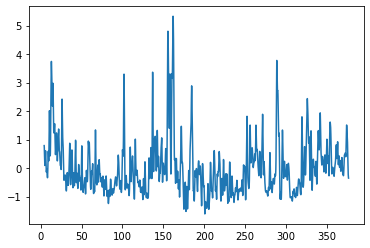

In [20]:
i = 1
plt.plot(time[i], z_sig[i])

In [21]:
csig = []
ctime = []
peaks = []
for i in range(len(fp)):
    csig.append(sig[i][start[i]:end[i]])
    ctime.append(np.array(time[i][start[i]:end[i]]))
    ds = downsampled_peaks(np.array(csig[i]),fs[i])
    csig.append(ds[0])
    peaks.append(ds[1])
# incage = 100
# outcage = incage+150
# start = np.floor(len(time8)/time8[-1]*incage).astype(int)
# end = np.floor(len(time8)/time8[-1]*outcage).astype(int)
# csig8=sig8[start:end]
# ctime8=np.array(time8[start:end])
# csig8,pk8=downsampled_peaks(np.array(csig8),fs)

NameError: name 'start' is not defined

(0, 410)

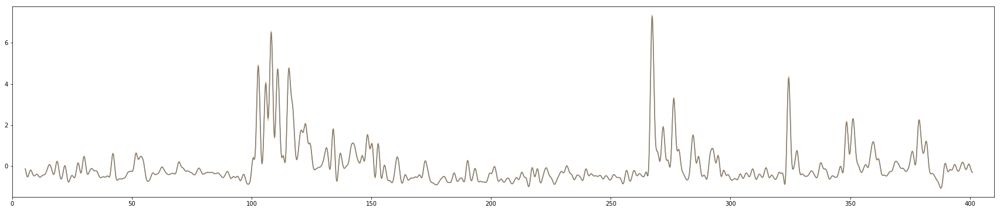

In [213]:
fig,ax = plt.subplots(figsize=(30,6))
test = scipy.signal.detrend(sig1)
test2 = butter_lowpass_filter(test,50,fs,order=3)
test3 = butter_highpass_filter(test2,0.1,fs,order=3)
test4 = scipy.signal.detrend(test3)
test5 = scipy.stats.zscore(test4)
# test5 = scipy.signal.filtfilt(sig1, sig1, sig1)
plt.plot(time1,test5)
plt.plot(time1,scipy.signal.detrend(scipy.stats.zscore(sig1)),alpha=0.5)
error=np.std(sig1)/np.sqrt(len(sig1))
plt.xlim(0,410)

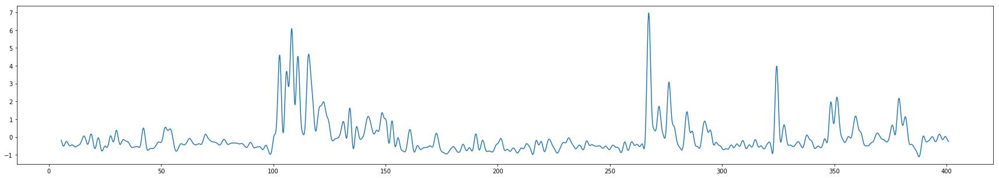

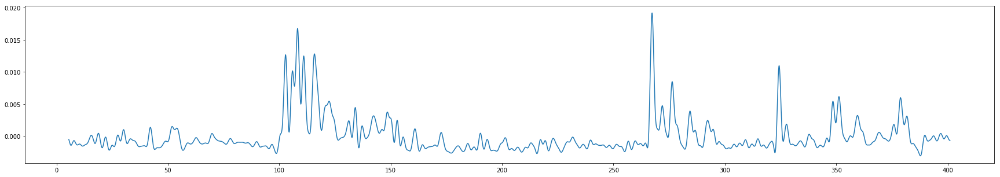

In [216]:
signal = scipy.signal.detrend(sig1)
sig1 = butter_lowpass_filter(signal,40,fs,order=3)
# sig2 = butter_highpass_filter(sig1,0.1,fs,order=3)
sig = scipy.stats.zscore(sig1)
fig,ax=plt.subplots(figsize=(30,5))
plt.plot(time1,sig)
fig,ax=plt.subplots(figsize=(30,5))
plt.plot(time1,(sig1))

### Crop and find peaks:

In [295]:
# balbc male
Cx = pos[0][0]
Cy = pos[0][1]
GCAMP = fp[0][0]
isos = fp[0][1]
fram = fp[0][2]
fs = fp[0][3]
sig1, time1 = downsample_FP(GCAMP, fram, fs, Cx, cam_fr=40)
s1 = filter_signal(sig1, fs)

# C57 female
Cx = pos[1][0]
Cy = pos[1][1]
GCAMP = fp[1][0]
isos = fp[1][1]
fram = fp[1][2]
fs = fp[1][3]
sig2, time2 = downsample_FP(GCAMP, fram, fs, Cx, cam_fr=40)
s2 = filter_signal(sig2, fs)

# C57 male
Cx = pos[2][0]
Cy = pos[2][1]
GCAMP = fp[2][0]
isos = fp[2][1]
fram = fp[2][2]
fs = fp[2][3]
sig3, time3 = downsample_FP(GCAMP, fram, fs, Cx, cam_fr=40)
s3 = filter_signal(sig3, fs)

# SW female
Cx = pos[3][0]
Cy = pos[3][1]
GCAMP = fp[3][0]
isos = fp[3][1]
fram = fp[3][2]
fs = fp[3][3]
sig4, time4 = downsample_FP(GCAMP, fram, fs, Cx, cam_fr=40)
s4 = filter_signal(sig4, fs)

# SW male
Cx = pos[4][0]
Cy = pos[4][1]
GCAMP = fp[4][0]
isos = fp[4][1]
fram = fp[4][2]
fs = fp[4][3]
sig5, time5 = downsample_FP(GCAMP, fram, fs, Cx, cam_fr=40)
s5 = filter_signal(sig5, fs)

# clean
Cx = pos[5][0]
Cy = pos[5][1]
GCAMP = fp[5][0]
isos = fp[5][1]
fram = fp[5][2]
fs = fp[5][3]
sig6, time6 = downsample_FP(GCAMP, fram, fs, Cx, cam_fr=40)
s6 = filter_signal(sig6, fs)

# empty
Cx = pos[6][0]
Cy = pos[6][1]
GCAMP = fp[6][0]
isos = fp[6][1]
fram = fp[6][2]
fs = fp[6][3]
sig7, time7 = downsample_FP(GCAMP, fram, fs, Cx, cam_fr=40)
s7 = filter_signal(sig7, fs)

# home
Cx = pos[7][0]
Cy = pos[7][1]
GCAMP = fp[7][0]
isos = fp[7][1]
fram = fp[7][2]
fs = fp[7][3]
sig8, time8 = downsample_FP(GCAMP, fram, fs, Cx, cam_fr=40)
s8 = filter_signal(sig8, fs)

In [290]:
s5.size

15903

In [311]:
times_in = np.array([100, 95, 92, 90, 90, 98, 90, 1])

In [296]:
# balbc male
# # sig1, time1 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = times_in[0]
outcage = incage+150
start = np.floor(len(time1)/time1[-1]*incage).astype(int)
end = np.floor(len(time1)/time1[-1]*outcage).astype(int)
csig1=s1[start:end]
ctime1=np.array(time1[start:end])
pk1=downsampled_peaks(csig1,fs)

# C57 female
# sig2, time2 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = times_in[1]
outcage = incage+150
start = np.floor(len(time2)/time2[-1]*incage).astype(int)
end = np.floor(len(time2)/time2[-1]*outcage).astype(int)
csig2=s2[start:end]
ctime2=np.array(time2[start:end])
pk2=downsampled_peaks(np.array(csig2),fs)

# C57 male
# sig3, time3 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = times_in[2]
outcage = incage+150
start = np.floor(len(time3)/time3[-1]*incage).astype(int)
end = np.floor(len(time3)/time3[-1]*outcage).astype(int)
csig3=s3[start:end]
ctime3=np.array(time3[start:end])
pk3=downsampled_peaks(np.array(csig3),fs)

# SW female
# sig4, time4 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = times_in[3]
outcage = incage+150
start = np.floor(len(time4)/time4[-1]*incage).astype(int)
end = np.floor(len(time4)/time4[-1]*outcage).astype(int)
csig4=s4[start:end]
ctime4=np.array(time4[start:end])
pk4=downsampled_peaks(np.array(csig4),fs)

# SW male
# sig5, time5 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = times_in[4]
outcage = incage+150
start = np.floor(len(time5)/time5[-1]*incage).astype(int)
end = np.floor(len(time5)/time5[-1]*outcage).astype(int)
csig5=s5[start:end]
ctime5=np.array(time5[start:end])
pk5=downsampled_peaks(np.array(csig5),fs)

# clean
# sig6, time6 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = times_in[5]
outcage = incage+150
start = np.floor(len(time6)/time6[-1]*incage).astype(int)
end = np.floor(len(time6)/time6[-1]*outcage).astype(int)
csig6=s6[start:end]
ctime6=np.array(time6[start:end])
pk6=downsampled_peaks(np.array(csig6),fs)

# empty
# sig7, time7 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = times_in[6]
outcage = incage+150
start = np.floor(len(time7)/time7[-1]*incage).astype(int)
end = np.floor(len(time7)/time7[-1]*outcage).astype(int)
csig7=s7[start:end]
ctime7=np.array(time7[start:end])
pk7=downsampled_peaks(np.array(csig7),fs)

# home
# sig8, time8 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = times_in[7]
outcage = incage+150
start = np.floor(len(time8)/time8[-1]*incage).astype(int)
end = np.floor(len(time8)/time8[-1]*outcage).astype(int)
csig8=s8[start:end]
ctime8=np.array(time8[start:end])
pk8=downsampled_peaks(np.array(csig8),fs)

In [297]:
csig1

array([ 0.69557086,  0.69935527,  0.70344811, ..., -0.62334471,
       -0.62668705, -0.62967323])

### Plot raw traces:

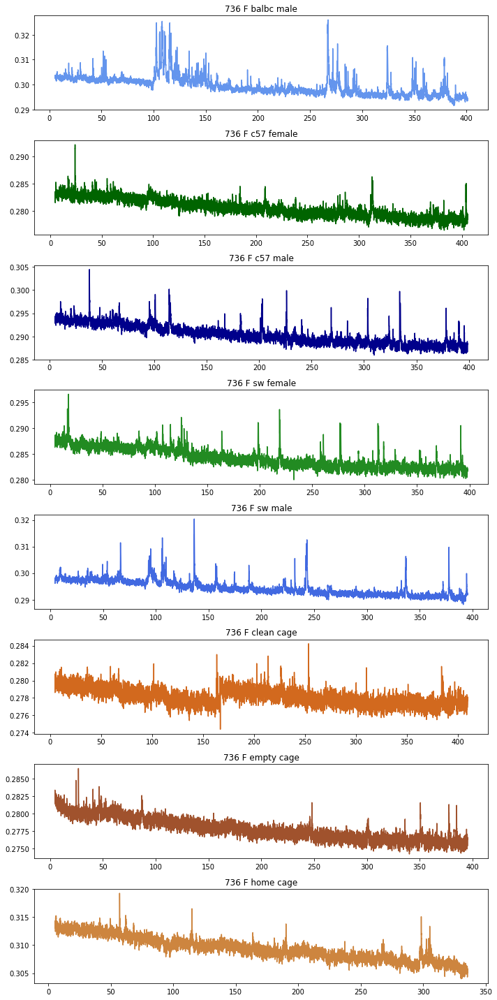

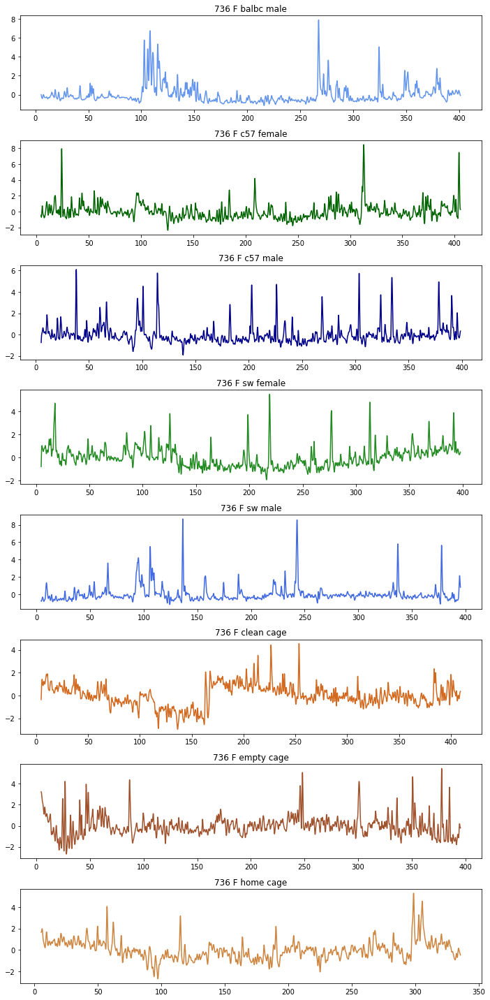

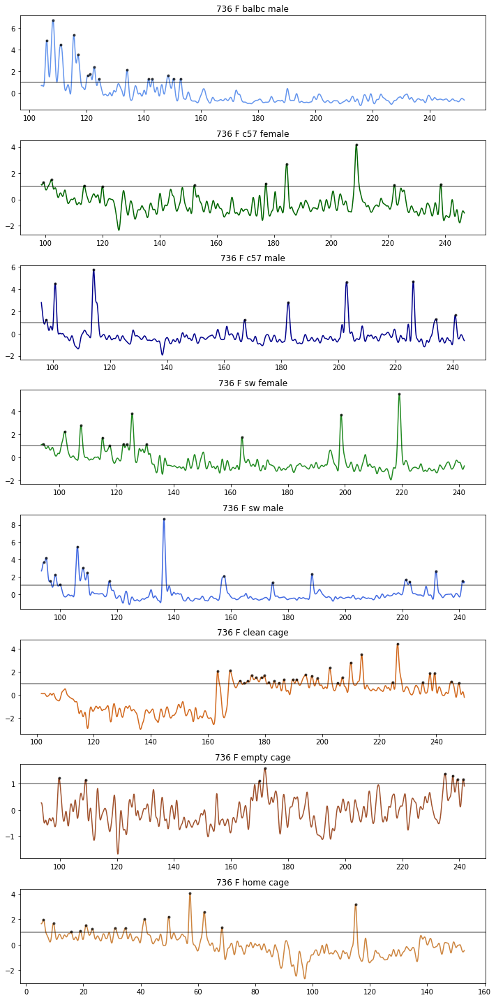

In [312]:
fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8)=plt.subplots(8,figsize=(10,20))
ax1.plot(time1, sig1, label='balbc male', c='cornflowerblue')
ax2.plot(time2, sig2, label='C57 female', c='darkgreen')
ax3.plot(time3, sig3, label='C57 male', c='darkblue')
ax4.plot(time4, sig4, label='SW female', c='forestgreen')
ax5.plot(time5, sig5, label='SW male', c='royalblue')
ax6.plot(time6, sig6, label='clean', c='chocolate')
ax7.plot(time7, sig7, label='empty', c='sienna')
ax8.plot(time8, sig8, label='home', c='peru')
ax1.set_title('741 M balbc male')
ax2.set_title('741 M c57 female')
ax3.set_title('741 M c57 male')
ax4.set_title('741 M sw female')
ax5.set_title('741 M sw male')
ax6.set_title('741 M clean cage')
ax7.set_title('741 M empty cage')
ax8.set_title('741 M home cage')
plt.tight_layout()
plt.savefig('/Users/dakotab/Desktop/PMVdatExperiments/CageContext/741M_rawtraces.png',dpi=300)

fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8)=plt.subplots(8,figsize=(10,20))
ax1.plot(time1, s1, label='balbc male', c='cornflowerblue')
ax2.plot(time2, s2, label='C57 female', c='darkgreen')
ax3.plot(time3, s3, label='C57 male', c='darkblue')
ax4.plot(time4, s4, label='SW female', c='forestgreen')
ax5.plot(time5, s5, label='SW male', c='royalblue')
ax6.plot(time6, s6, label='clean', c='chocolate')
ax7.plot(time7, s7, label='empty', c='sienna')
ax8.plot(time8, s8, label='home', c='peru')
ax1.set_title('741 M balbc male')
ax2.set_title('741 M c57 female')
ax3.set_title('741 M c57 male')
ax4.set_title('741 M sw female')
ax5.set_title('741 M sw male')
ax6.set_title('741 M clean cage')
ax7.set_title('741 M empty cage')
ax8.set_title('741 M home cage')
plt.tight_layout()
plt.savefig('/Users/dakotab/Desktop/PMVdatExperiments/CageContext/741M_downsampled.png',dpi=300)

fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8)=plt.subplots(8,figsize=(10,20))
ax1.plot(ctime1, csig1, label='BalbC male', c='cornflowerblue')
ax1.plot(ctime1[pk1], csig1[pk1], '.',alpha=0.65, c='k')
ax1.axhline(1, c='k', alpha=0.5)

ax2.plot(ctime2, csig2, label='C57 female', c='darkgreen')
ax2.plot(ctime2[pk2], csig2[pk2], '.',alpha=0.65, c='k')
ax2.axhline(1, c='k', alpha=0.5)

ax3.plot(ctime3, csig3, label='C57 male', c='darkblue')
ax3.plot(ctime3[pk3], csig3[pk3], '.',alpha=0.65, c='k')
ax3.axhline(1, c='k', alpha=0.5)

ax4.plot(ctime4, csig4, label='SW female', c='forestgreen')
ax4.plot(ctime4[pk4], csig4[pk4], '.',alpha=0.65, c='k')
ax4.axhline(1, c='k', alpha=0.5)

ax5.plot(ctime5, csig5, label='SW male', c='royalblue')
ax5.plot(ctime5[pk5], csig5[pk5], '.',alpha=0.65, c='k')
ax5.axhline(1, c='k', alpha=0.5)

ax6.plot(ctime6, csig6, label='clean', c='chocolate')
ax6.plot(ctime6[pk6], csig6[pk6], '.',alpha=0.65, c='k')
ax6.axhline(1, c='k', alpha=0.5)

ax7.plot(ctime7, csig7, label='empty', c='sienna')
ax7.plot(ctime7[pk7], csig7[pk7], '.',alpha=0.65, c='k')
ax7.axhline(1, c='k', alpha=0.5)

ax8.plot(ctime8, csig8, label='home', c='peru')
ax8.plot(ctime8[pk8],csig8[pk8],'.',alpha=0.65, c='k')
ax8.axhline(1, c='k', alpha=0.5)
ax1.set_title('741 M balbc male')
ax2.set_title('741 M c57 female')
ax3.set_title('741 M c57 male')
ax4.set_title('741 M sw female')
ax5.set_title('741 M sw male')
ax6.set_title('741 M clean cage')
ax7.set_title('741 M empty cage')
ax8.set_title('741 M home cage')
plt.tight_layout()
plt.savefig('/Users/dakotab/Desktop/PMVdatExperiments/CageContext/741M_peaksincage.png',dpi=300)

Text(0.5,1,'736F Home Cage')

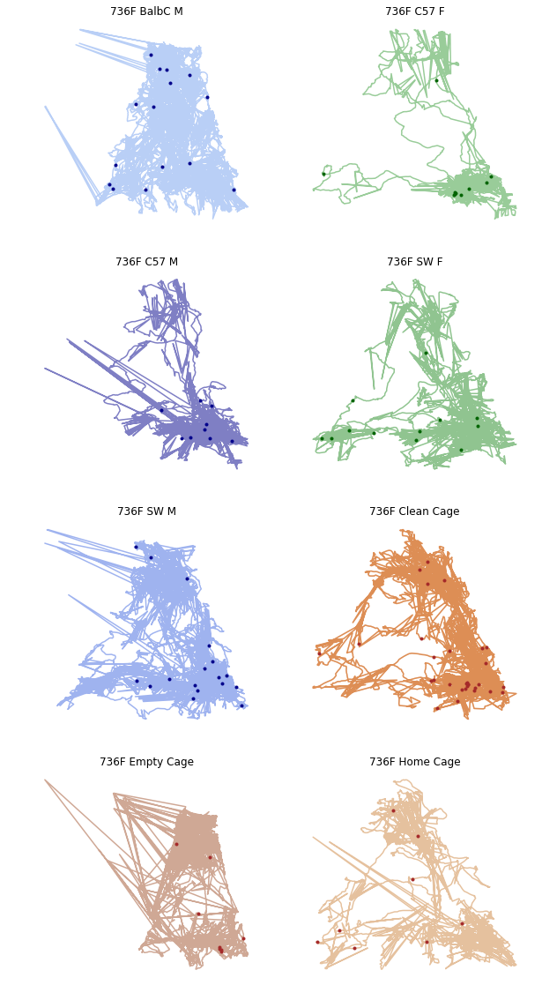

In [320]:
fig, axes = plt.subplots(4,2,figsize=(10,20))

# balbc male
# sig2, time2 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = (times_in[0])*40
outcage = (incage+150)*40
Cx = pos[0][0][incage:outcage]
Cy = pos[0][1][incage:outcage]
axes[0,0].plot(Cx,Cy,c='cornflowerblue',alpha=0.45)
axes[0,0].plot(Cx[pk1],Cy[pk1],'.',c='darkblue')
axes[0,0].set_title('736F BalbC M')
axes[0,0].axis('off')

# C57 female
# sig2, time2 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = (times_in[1])*40
outcage = (incage+150)*40
Cx = pos[1][0][incage:outcage]
Cy = pos[1][1][incage:outcage]
axes[0,1].plot(Cx,Cy,c='green',alpha=0.4)
axes[0,1].plot(Cx[pk2],Cy[pk2],'.',c='darkgreen')
axes[0,1].set_title('736F C57 F')
axes[0,1].axis('off')

# C57 male
# sig3, time3 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = (times_in[2])*40
outcage = (incage+150)*40
Cx = pos[2][0][incage:outcage]
Cy = pos[2][1][incage:outcage]
axes[1,0].plot(Cx,Cy,c='darkblue',alpha=0.5)
axes[1,0].plot(Cx[pk3],Cy[pk3],'.',c='darkblue')
axes[1,0].axis('off')
axes[1,0].set_title('736F C57 M')

# SW female
# sig4, time4 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = (times_in[3])*40
outcage = (incage+150)*40
Cx = pos[3][0][incage:outcage]
Cy = pos[3][1][incage:outcage]
axes[1,1].plot(Cx,Cy,c='forestgreen',alpha=0.5)
axes[1,1].plot(Cx[pk4],Cy[pk4],'.',c='darkgreen')
axes[1,1].axis('off')
axes[1,1].set_title('736F SW F')

# SW male
# sig5, time5 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = (times_in[4])*40
outcage = (incage+150)*40
Cx = pos[4][0][incage:outcage]
Cy = pos[4][1][incage:outcage]
axes[2,0].plot(Cx,Cy,c='royalblue',alpha=0.5)
axes[2,0].plot(Cx[pk5],Cy[pk5],'.',c='darkblue')
axes[2,0].axis('off')
axes[2,0].set_title('736F SW M')

# clean
# 741: home
# sig6, time6 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = (times_in[5])*40
outcage = (incage+150)*40
Cx = pos[5][0][incage:outcage]
Cy = pos[5][1][incage:outcage]
axes[2,1].plot(Cx,Cy,c='Chocolate',alpha=0.5)
axes[2,1].plot(Cx,Cy,c='chocolate',alpha=0.5)
axes[2,1].plot(Cx[pk6],Cy[pk6],'.',c='brown')
axes[2,1].axis('off')
axes[2,1].set_title('736F Clean Cage')

# empty
# sig7, time7 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = (times_in[6])*40
outcage = (incage+150)*40
Cx = pos[6][0][incage:outcage]
Cy = pos[6][1][incage:outcage]
axes[3,0].plot(Cx,Cy,c='sienna',alpha=0.5)
axes[3,0].plot(Cx[pk7],Cy[pk7],'.',c='brown')
axes[3,0].axis('off')
axes[3,0].set_title('736F Empty Cage')

# home
# sig8, time8 = downsample_FP(GCAMP, fram, fs, cam_fr=40)
incage = (times_in[7])*40
outcage = (incage+150)*40
Cx = pos[7][0][incage:outcage]
Cy = pos[7][1][incage:outcage]
axes[3,1].plot(Cx,Cy,c='peru',alpha=0.5)
axes[3,1].plot(Cx[pk7],Cy[pk7],'.',c= 'brown')
axes[3,1].axis('off')
axes[3,1].set_title('736F Home Cage')

# plt.savefig('/Users/dakotab/Desktop/PMVdatExperiments/CageContext/736F_peak_locations.png', dpi=300)

In [302]:
Cx[pk1]

array([892.21096611, 918.51778239, 743.08800441, 736.96652058,
       604.83327091, 679.2629509 , 665.70738393, 720.5614999 ,
       781.22240621, 775.74766016, 903.62968996, 920.7009564 ,
       907.29576695, 846.87654114, 619.45108968])

In [23]:
# fp_dat = sorted(glob.glob('/Volumes/falkner/Dakota/PMV_AM/datM741_pairwise_BalbC/pairwise*'))
# fp = [load_fp(f) for f in fp_dat]

fp = load_fp('/Volumes/falkner/Dakota/PMV_AM/datM745_pairwise_BalbC_homecage1H/')

read from t=0s to t=457.95s


Text(0.5,1,'a brief interlude: what the fuck happened to my signal')

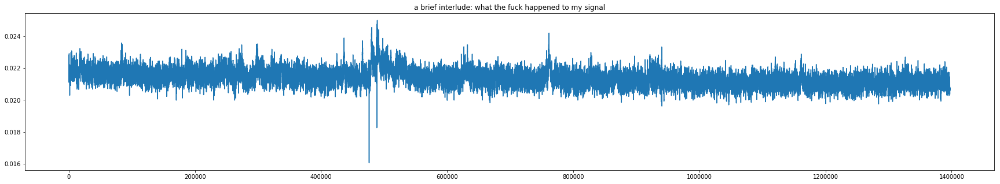

In [27]:
fig,ax=plt.subplots(figsize=(30,5))
plt.plot(fp[0])
plt.title('a brief interlude: what the fuck happened to my signal')

read from t=0s to t=463.57s


Text(0.5,1,'interlude over: next time make sure your PATCH CORD IS ATTACHED CORRECTLY')

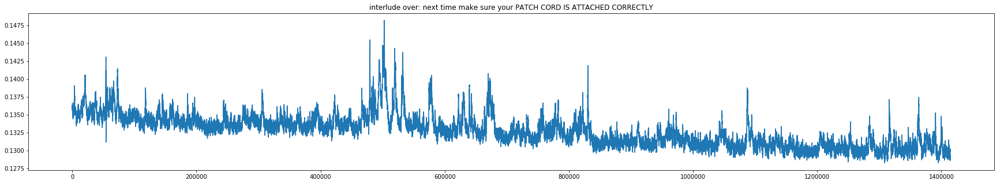

In [30]:
fp = load_fp('/Volumes/falkner/Dakota/PMV_AM/datM745_pairwise_BalbC/pairwise_BalbC_homecage1/')
fig,ax=plt.subplots(figsize=(30,5))
plt.plot(fp[0])
plt.title('interlude over: next time make sure your PATCH CORD IS ATTACHED CORRECTLY')

In [ ]:
# load csv data & compute centroids
csv_file_path = '/Volumes/falkner/Dakota/PMV_AM/191218_datM741_cageday/191218_datM741_homecage_b-12182019132759-0000DeepCut_resnet50_191219_PMVcagedayDec19shuffle1_1030000.csv'
Cx, Cy = load_dlc(csv_file_path)
TCDistance, LCDistance, RCDistance = calculate_cage_distance(csv_file_path)

# load FP data & extract gcamp, fram, isos, etc
# downsample data based on Cx, Cy
fp_file_path = '/Volumes/falkner/Dakota/PMV_AM/191218_datM741_cageday/191218_datM741_homecage/'
GCAMP, ISOS, fram, fs = load_fp(fp_file_path)

In [ ]:
# downsample, detrend & calculate peaks
signal_ds, time_ds = downsample_FP(GCAMP, fram, fs, cam_fr=40)
sig,peaks = downsampled_peaks(np.array(signal_ds), fs)
zscore = scipy.stats.zscore(sig)

fig,(ax1,ax2,ax3,ax4)=plt.subplots(4, figsize=(30,5))
ax1.plot(time_ds, zscore)
ax2.plot(RCDistance, c='darkgreen')
ax3.plot(LCDistance, c='purple')
ax4.plot(TCDistance, c='darkblue')

In [ ]:
time_x = np.linspace(1, npts, npts) / fs
incage = 112
start_cage = np.floor(time_x.size/time_x[-1]*incage).astype(int)
start_cage
frame_in = incage * 40 #fps
Cx = Cx[frame_in:-1]
Cy = Cy[frame_in:-1]

In [ ]:
tx = scipy.stats.binned_statistic(TCDistance, zscore, statistic='mean', bins=100)[0]
ty = scipy.stats.binned_statistic(TCDistance, zscore, statistic='mean', bins=100)[1]
tbin_centers = [np.mean([ty[i], ty[i+1]]) for i in range(len(ty)-1)]

rx = scipy.stats.binned_statistic(RCDistance, zscore, statistic='mean', bins=100)[0]
ry = scipy.stats.binned_statistic(RCDistance, zscore, statistic='mean', bins=100)[1]
rbin_centers = [np.mean([ry[i], ry[i+1]]) for i in range(len(ry)-1)]

lx = scipy.stats.binned_statistic(LCDistance, zscore, statistic='mean', bins=100)[0]
ly = scipy.stats.binned_statistic(LCDistance, zscore, statistic='mean', bins=100)[1]
lbin_centers = [np.mean([ly[i], ly[i+1]]) for i in range(len(ly)-1)]
lbin_centers = np.array(lbin_centers)
# lbin_centers = lbin_centers - 400

fig,ax=plt.subplots(figsize=(15,5))
plt.plot(tbin_centers, tx, c='darkblue', label='top corner distance')
plt.plot(rbin_centers, rx, c='darkgreen', label='right corner distance')
plt.plot(lbin_centers, lx, c='purple', label='left corner distance')
# plt.xlim(0,1100)
plt.ylabel('z score')
plt.xlabel('distance (pixels)')
plt.title('SWM Cage')
plt.legend(loc=1)

In [ ]:
np.where(np.isnan(rx)==True)

In [ ]:
def downsample_FP(signal, fram, fs, cam_fr=40, Cx=Cx):
    """
    Inputs:
    -------
    signal: GCAMP (or isosbestic) array of signal values from the TDT system
    fram: array of camera onset times accoording to TDT
    fs: sampling frequency of data
    cam_fr: camera frame rate. in our case values are the same for all cage day trials, but they may not always be!
    Cx: required for downsampling based on positional tracking using dlc
    
    Returns:
    --------
    signal_ds: downsampled signal based on dx
    """
    import math
    sr_diff = fs/cam_fr
    rec_onset = fram[0]
    rec_offset = fram[-1]
    
    ## FIRST: restrict signal to times when camera is on
    # Turn the GCAMP frames into seconds 
    signal_times = np.arange(0, (len(signal)/fs), (1/fs))
    # Calculate the index within the GCAMP stream that the camera turns on 
    cam_on_idx = (np.where(signal_times==(find_nearest(signal_times,rec_onset))))
    # Calculate the time in sec within the GCAMP stream that the camera turns on
    cam_on_sec = signal_times[cam_on_idx][0]
    # Calculate the index within the GCAMP stream that the camera turns off 
    cam_off_idx = (np.where(signal_times==(find_nearest(signal_times, rec_offset))))
    # Calculate the time in sec within the GCAMP stream that the camera turns off
    cam_off_sec = signal_times[cam_off_idx][0] 
    # crop GCAMP signal from camera on to camera off
    signal_cropped = signal[cam_on_idx[0][0]:cam_off_idx[0][0]]
    
    # Create time array based on number of samples and sample frequency
    # crop time signal from camera on to camera off
    npts = len(signal)
    time_x = np.linspace(1, npts, npts) / fs
    # do the same for the time vector
    signal_cropped_time = len(signal_cropped)/fs
    time_cropped = time_x[cam_on_idx[0][0]:cam_off_idx[0][0]]
    # Downsample the cropped GCAMP recording to align with the camera frames so can match up with 
    # the Cx and Cy vectors
    signal_ds = []
    for idx, frame in enumerate(Cx):
        signal_ds.append(signal_cropped[int(np.round((idx*sr_diff)))])
    time_ds = []
    for idx, frame in enumerate(Cx):
        time_ds.append(time_cropped[int(np.round((idx*sr_diff)))])
    return signal_ds, time_ds

In [ ]:
load_fp('/Volumes/falkner/Dakota/PMV_AM/191219_datM746_cageday/')

In [ ]:
import math
sr_diff = fs/cam_fr
rec_onset = fram[0]
rec_offset = fram[-1]

# ## FIRST: restrict signal to times when camera is on
# # Turn the GCAMP frames into seconds 
# signal_times = np.arange(0, (len(signal)/fs), (1/fs))
# # Calculate the index within the GCAMP stream that the camera turns on 
# cam_on_idx = (np.where(signal_times==(find_nearest(signal_times,rec_onset))))
# # Calculate the time in sec within the GCAMP stream that the camera turns on
# cam_on_sec = signal_times[cam_on_idx][0]
# # Calculate the index within the GCAMP stream that the camera turns off 
# cam_off_idx = (np.where(signal_times==(find_nearest(signal_times, rec_offset))))
# # Calculate the time in sec within the GCAMP stream that the camera turns off
# cam_off_sec = signal_times[cam_off_idx][0] 
# # crop GCAMP signal from camera on to camera off
# signal_cropped = signal[cam_on_idx[0][0]:cam_off_idx[0][0]]

# # Create time array based on number of samples and sample frequency
# # crop time signal from camera on to camera off
# npts = len(signal)
# time_x = np.linspace(1, npts, npts) / fs
# # do the same for the time vector
# signal_cropped_time = len(signal_cropped)/fs
# time_cropped = time_x[cam_on_idx[0][0]:cam_off_idx[0][0]]
# # Downsample the cropped GCAMP recording to align with the camera frames so can match up with 
# # the Cx and Cy vectors
# signal_ds = []
# for idx, frame in enumerate(Cx):
#     signal_ds.append(signal_cropped[int(np.round((idx*sr_diff)))])
# time_ds = []
# for idx, frame in enumerate(Cx):
#     time_ds.append(time_cropped[int(np.round((idx*sr_diff)))])